### 1. Wstęp

Celem projektu jest analiza sentymentu w mediach społecznościowych dotycząca tematu feminizmu. Zbadam tweety po angielsku zawierające hashtagi: #feminism, #genderequality i #fem2, aby poznać ogólną opinię społeczeństwa na ten temat.

Tweety zostały pobrane dzięki Twitter API i bibliotece snscrape.

### 2. Preprocessing

Tweety zostały zapisane do pliku 'tweets.csv', a następnie przetworzone w kilku krokach:
- usunięcie znaków nowej linii, tabulacji itp.
- usunięcie angielskich skrótów typu "isn't", "haven't" i zastąpienie ich pełnymi formami
- usunięcie adresów url
- tokenizacja
- usunięcie stopwords

In [229]:
import time
import snscrape.modules.twitter as sntwitter
import nltk
import contractions
from nltk.sentiment import SentimentIntensityAnalyzer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import re
import text2emotion as te
from datetime import datetime, timedelta
import csv

In [168]:
# hashtags = ["feminism", "genderequality", "fem2"]

# tweets = []

# for hashtag in hashtags:
#     for i, tweet in enumerate(sntwitter.TwitterSearchScraper(f"{hashtag}").get_items()):
#         tweets.append(tweet.content)
#         time.sleep(0.1)

#         if len(tweets) >= 10000:
#             break

# with open("tweets.csv", "w", encoding="utf-8") as f:
#     f.write("|".join(tweets))

In [169]:
with open("tweets.csv", "r", encoding="utf-8") as f:
    tweets = f.read().split("|")

print(tweets)
print(len(tweets))

['@men_are_human Feminism has been turned into a joke the second men started dressing like women to take all their privileges and they are to scared to get cancelled to fight back!', 'me, an antizionist Jew reading this- are… are you ok? Feminism is when you condemn Israel I guess?', 'Shape-shifting misogyny has invaded mainstream feminism https://t.co/hZXJPromJy via @femlnistcurrent', "紅丸是男人的女權。\n\nThe Red Pill is men's feminism.", '@MoNaaNaaNaa Feminism ki smell aa rhi hai😂', 'She likes (G)-idle, tomboy started a conversation on feminism LMAO', "@3ScotchEggs @angelbabe80 As a biological female I wish a man would let me work in the house and raise his kids. I'm tired of feminism 🥺👉👈", "@BrightIsadora1 Give me a break. You're on here claiming to be a victim of feminism while blaming me for inevitable societal collapse of what was ALWAYS a dysfunctional system. Were Black families happier before feminism? https://t.co/W8GreRUWH8", '@realDailyWire That anyone who says they are a woman is

In [170]:
# replace newlines, tabs, double spaces
tweets = [tweet.replace("\n", " ") for tweet in tweets]
tweets = [tweet.replace("\r", " ") for tweet in tweets]
tweets = [tweet.replace("\t", " ") for tweet in tweets]
tweets = [tweet.replace("  ", " ") for tweet in tweets]
print(tweets)

# remove contractions
tweets = [contractions.fix(tweet) for tweet in tweets]

# remove links regex
pattern = 'https://t.co/\w+'
tweets = [re.sub(pattern, '', tweet) for tweet in tweets]


print(tweets)

['@men_are_human Feminism has been turned into a joke the second men started dressing like women to take all their privileges and they are to scared to get cancelled to fight back!', 'me, an antizionist Jew reading this- are… are you ok? Feminism is when you condemn Israel I guess?', 'Shape-shifting misogyny has invaded mainstream feminism https://t.co/hZXJPromJy via @femlnistcurrent', "紅丸是男人的女權。 The Red Pill is men's feminism.", '@MoNaaNaaNaa Feminism ki smell aa rhi hai😂', 'She likes (G)-idle, tomboy started a conversation on feminism LMAO', "@3ScotchEggs @angelbabe80 As a biological female I wish a man would let me work in the house and raise his kids. I'm tired of feminism 🥺👉👈", "@BrightIsadora1 Give me a break. You're on here claiming to be a victim of feminism while blaming me for inevitable societal collapse of what was ALWAYS a dysfunctional system. Were Black families happier before feminism? https://t.co/W8GreRUWH8", '@realDailyWire That anyone who says they are a woman is, w

Nie przetwarzałam tweetów na zasadach Bag of Words, ponieważ ze źródeł wymienionych w bibliografii wynika, iż w przypadku analizy tekstów jest to złe rozwiązanie obniżające efektywność analizy. Lematyzacja może zmienić kontekst wypowiedzi na błędny, a stopwords z biblioteki NLTK zawierają takie słowa jak na przykład "not", co również wpływa na sens wypowiedzi. Z tego powodu, posiłkując się domyślną listą stopwords, wykorzystałam tylko te, które uważam za odpowiednie. Nie usuwałam także interpunkcji oraz emotikonów, ponieważ są one ważne dla narzędzi analizujących sentyment i emocje.

In [171]:
# tokenize
tweets = [nltk.word_tokenize(tweet) for tweet in tweets]
print(tweets)

# remove stopwords
stopwords = ["amp", "s", ",", ".", ":", "&", ";", "can", "down", "from", "are", "too", "through", "does", "but", "now", "some", "below", "to", "against", "here", "won", "did", "yourselves", "was", "how", "above", "him", "which", "himself", "its", "most", "the", "while", "your", "yours", "she", "her", "any", "off", "than", "why", "has", "only", "have", "itself", "for", "under", "own", "were", "those", "out", "very", "until", "hers", "after", "they", "their", "doing", "them", "where", "ourselves", "themselves", "our", "that", "theirs", "nor", "ours", "again", "same", "over", "just", "because", "who", "before", "more", "being", "had", "this", "with", "should", "what", "during", "herself", "and", "these", "such", "further", "having", "yourself", "into", "his", "once", "each", "all", "then", "both", "when", "will", "whom", "you", "between", "myself", "about", "been", "am", "as", "be", "a", "an", "we", "it", "or", "if", "is", "so", "in", "up", "by", "do", "he", "me", "o", "i"]
tweets = [[word for word in tweet if word.lower() not in stopwords] for tweet in tweets]
print(tweets)

# join back into strings
tweets = [" ".join(tweet) for tweet in tweets]
print(tweets)

[['@', 'men_are_human', 'Feminism', 'has', 'been', 'turned', 'into', 'a', 'joke', 'the', 'second', 'men', 'started', 'dressing', 'like', 'women', 'to', 'take', 'all', 'their', 'privileges', 'and', 'they', 'are', 'to', 'scared', 'to', 'get', 'cancelled', 'to', 'fight', 'back', '!'], ['me', ',', 'an', 'antizionist', 'Jew', 'reading', 'this-', 'are…', 'are', 'you', 'ok', '?', 'Feminism', 'is', 'when', 'you', 'condemn', 'Israel', 'I', 'guess', '?'], ['Shape-shifting', 'misogyny', 'has', 'invaded', 'mainstream', 'feminism', 'via', '@', 'femlnistcurrent'], ['紅丸是男人的女權。', 'The', 'Red', 'Pill', 'is', 'men', "'s", 'feminism', '.'], ['@', 'MoNaaNaaNaa', 'Feminism', 'ki', 'smell', 'aa', 'rhi', 'hai😂'], ['She', 'likes', '(', 'G', ')', '-idle', ',', 'tomboy', 'started', 'a', 'conversation', 'on', 'feminism', 'LMAO'], ['@', '3ScotchEggs', '@', 'angelbabe80', 'As', 'a', 'biological', 'female', 'I', 'wish', 'a', 'man', 'would', 'let', 'me', 'work', 'in', 'the', 'house', 'and', 'raise', 'his', 'kids', '

### 3. Analiza opinii

Uznałam, że nie będę ignorować neutralnych tweetów. Za negatywne uznaję takie ze wskaźnikiem mniejszym lub równym -0.5, natomiast za pozytywne ze wskaźnikiem większym lub równym 0.5. Następnie zamieniam je na liczby (-1 - negative, 0 - neutral, 1 - positive) aby łatwiej je podzielić i stworzyć z nich WordClouds.

In [172]:
sid = SentimentIntensityAnalyzer()

def analyze_sentiment(tweet):
    compound = sid.polarity_scores(tweet)["compound"]
    if compound >= 0.5:
        return 1
    elif compound <= -0.5:
        return -1
    else:
        return 0
    
sentiments = [analyze_sentiment(tweet) for tweet in tweets]
positives = [sentiment for sentiment in sentiments if sentiment == 1]
negatives = [sentiment for sentiment in sentiments if sentiment == -1]
neutrals = [sentiment for sentiment in sentiments if sentiment == 0]

print(f"Positives: {len(positives)}")
print(f"Negatives: {len(negatives)}")
print(f"Neutrals: {len(neutrals)}")

Positives: 1732
Negatives: 1995
Neutrals: 6298


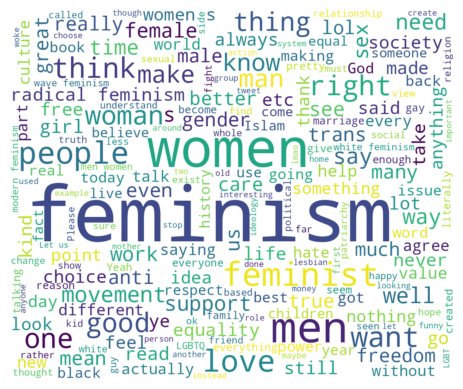

In [173]:
positives = [tweet for tweet, sentiment in zip(tweets, sentiments) if sentiment == 1]
positives = " ".join(positives)
positives_wordcloud = WordCloud(width=1200, height=1000, background_color="white").generate(positives)
plt.imshow(positives_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()



WordCloud pozytywny jest zgodny z oczekiwaniami: najczęściej powtarzają się takie słowa jak feminism, women, men, people itd., nie zauważam żadnych zaskakujących słów. Występują także słowa dotyczące tematów, z którymi feminizm często idzie w parze, takie jak lesbian, LGBT, God, Islam.

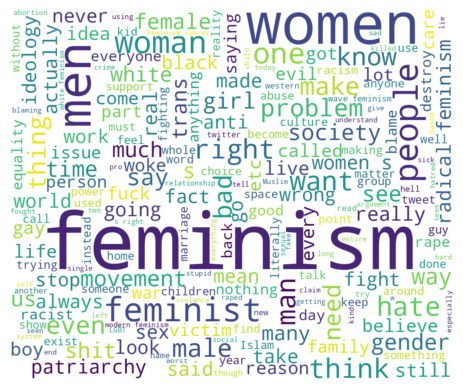

In [174]:
negatives = [tweet for tweet, sentiment in zip(tweets, sentiments) if sentiment == -1]
negatives = " ".join(negatives)
negatives_wordcloud = WordCloud(width=1200, height=1000, background_color="white").generate(negatives)
plt.imshow(negatives_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

WordCloud negatywny jest dość podobny, jednak widzimy tutaj już więcej słów sugerujących dyskusję, jak np. problem, reason, wrong, fact, believe. Widać też przekleństwa oraz kolejne nawiązania do innych problemów społecznych (racist, rape).

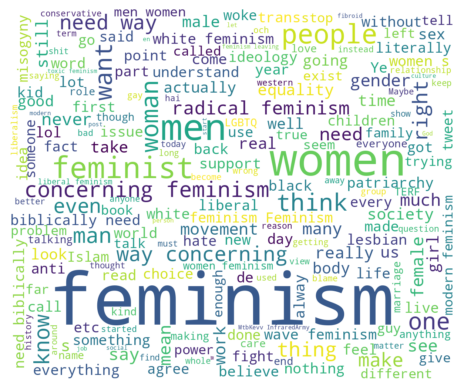

In [175]:
neutrals = [tweet for tweet, sentiment in zip(tweets, sentiments) if sentiment == 0]
neutrals = " ".join(neutrals)
neutrals_wordcloud = WordCloud(width=1200, height=1000, background_color="white").generate(neutrals)
plt.imshow(neutrals_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

WordCloud neutralny też znacząco się nie różni, głównie przekazuje słowa używane w dyskusjach: need, know, see, believe, agree, understand.

Przy analizie emocji ustaliłam, że tweet ze wskaźnikiem emocji większym lub równym 0.4 będzie do niej przydzielony, co znaczy, że tweet może należeć np. jednocześnie do smutnych i zaskoczonych.

In [182]:
emotions = [te.get_emotion(tweet) for tweet in tweets]
happy = []
sad = []
angry = []
surprise = []
fear = []
for emotion in emotions:
    if emotion["Happy"] >= 0.4:
        happy.append(emotion)
    if emotion["Sad"] >= 0.4:
        sad.append(emotion)
    if emotion["Angry"] >= 0.4:
        angry.append(emotion)
    if emotion["Surprise"] >= 0.4:
        surprise.append(emotion)
    if emotion["Fear"] >= 0.4:
        fear.append(emotion)

print(f"Happy: {len(happy)}")
print(f"Sad: {len(sad)}")
print(f"Angry: {len(angry)}")
print(f"Surprise: {len(surprise)}")
print(f"Fear: {len(fear)}")



Happy: 965
Sad: 2454
Angry: 581
Surprise: 1181
Fear: 3564


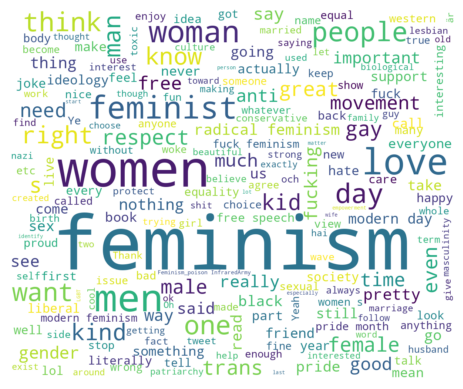

In [183]:
happy = [tweet for tweet, emotion in zip(tweets, emotions) if emotion["Happy"] >= 0.4]
happy = " ".join(happy)
happy_wordcloud = WordCloud(width=1200, height=1000, background_color="white").generate(happy)
plt.imshow(happy_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

Ciekawe słowa: kind, well, enjoy, free, fine, happy.

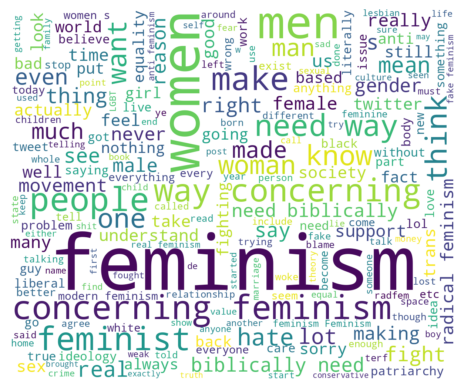

In [184]:
sad = [tweet for tweet, emotion in zip(tweets, emotions) if emotion["Sad"] >= 0.4]
sad = " ".join(sad)
sad_wordcloud = WordCloud(width=1200, height=1000, background_color="white").generate(sad)
plt.imshow(sad_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

Ciekawe słowa: fake, blame, crime, conservative. Zdziwiło mnie słowo "lol" w smutnym zestawieniu, jednak po części to rozumiem, ponieważ często jest używane sarkastycznie.

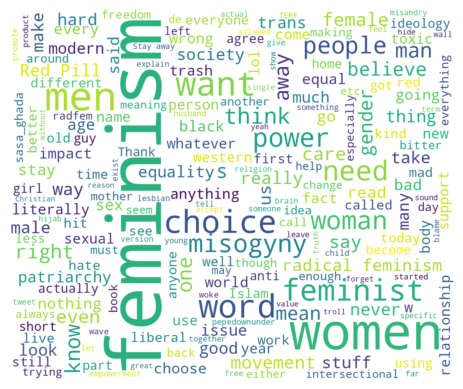

In [185]:
angry = [tweet for tweet, emotion in zip(tweets, emotions) if emotion["Angry"] >= 0.4]
angry = " ".join(angry)
angry_wordcloud = WordCloud(width=1200, height=1000, background_color="white").generate(angry)
plt.imshow(angry_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

W zdenerwowanych słowach zaciekawiło mnie wystąpienie zwrotu Red Pill, który jest toksycznym odpowiednikiem feminizmu u mężczyzn.

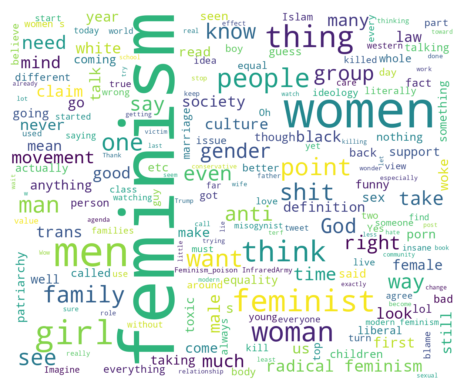

In [186]:
surprise = [tweet for tweet, emotion in zip(tweets, emotions) if emotion["Surprise"] >= 0.4]
surprise = " ".join(surprise)
surprise_wordcloud = WordCloud(width=1200, height=1000, background_color="white").generate(surprise)
plt.imshow(surprise_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [205]:
start_date = datetime(2019, 1, 1)
end_date = datetime(2023, 5, 31)

# topic = "#feminism"

# tweets = []

# curr_date = start_date
# while curr_date < end_date:
#     counter = 0
#     for i, tweet in enumerate(sntwitter.TwitterSearchScraper(f"{topic} since:{curr_date.strftime('%Y-%m-%d')} until:{(curr_date + timedelta(days=30)).strftime('%Y-%m-%d')}").get_items()):
#         tweets.append([tweet.content, curr_date.strftime('%Y-%m-%d')])
#         counter += 1
#         time.sleep(0.1)

#         if counter >= 20:
#             break

        

#     curr_date += timedelta(days=30)

# with open("tweets_dates.csv", "w", encoding="utf-8") as f:
#     for tweet in tweets:
#         f.write(f"{tweet[0]}|{tweet[1]}\n")

['2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-01', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-01-31', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-03-02', '2019-04-01', '2019-04-01', '2019-04-01', '2019-04-01', '2019-04-01', '2019-04-01', '2019-04-01', '2019-04-01', '2019-04-01', '2019-04-01', '2019-04-01', '2019

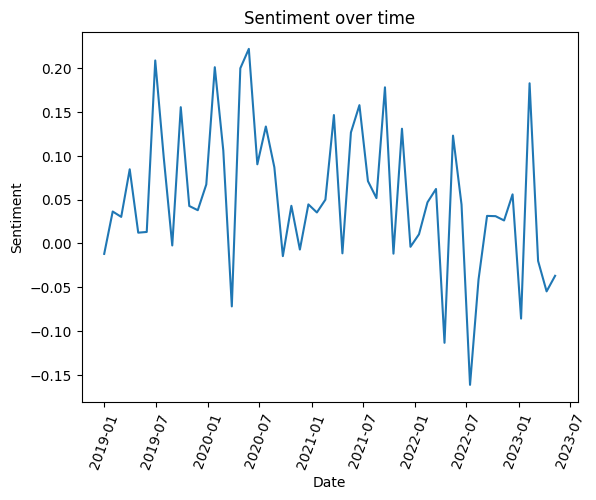

<Figure size 3000x1000 with 0 Axes>

In [248]:
with open ("tweets_dates.csv", "r", encoding="utf-8") as f:
    tweets_with_dates = f.read().split("\n")

dates = []

with open("tweets_dates.csv", "r", encoding="utf-8") as f:
    reader = csv.reader(f, delimiter="|")
    for row in reader:
        if len(row) > 1:
            dates.append(row[1])

print(dates)


tweets = [tweet.split("|") for tweet in tweets_with_dates]

# replace newlines, tabs, double spaces
tweets = [tweet[0] for tweet in tweets]
tweets = [tweet.replace("\t", " ") for tweet in tweets]
tweets = [tweet.replace("  ", " ") for tweet in tweets]
tweets = [tweet.replace("\n", " ") for tweet in tweets]
tweets = [tweet.replace("\r", " ") for tweet in tweets]

# remove contractions
tweets = [contractions.fix(tweet) for tweet in tweets]

# remove links regex
pattern = 'https://t.co/\w+'
tweets = [re.sub(pattern, '', tweet) for tweet in tweets]

# tokenize
tweets = [nltk.word_tokenize(tweet) for tweet in tweets]

# remove stopwords
tweets = [[word for word in tweet if word.lower() not in stopwords] for tweet in tweets]

# join back into strings
tweets = [" ".join(tweet) for tweet in tweets]
print(tweets)

sid = SentimentIntensityAnalyzer()

sentiments = [sid.polarity_scores(tweet)['compound'] for tweet in tweets]

# group by date
sentiments_by_date = {}
for i, date in enumerate(dates):
    if date not in sentiments_by_date:
        sentiments_by_date[date] = [sentiments[i]]
    else:
        sentiments_by_date[date].append(sentiments[i])

# average sentiment per date
avg_sentiments = {}

for date in sentiments_by_date:
    avg_sentiments[date] = sum(sentiments_by_date[date]) / len(sentiments_by_date[date])

# plot with one month intervals
x = []
y = []
curr_date = start_date
while curr_date < end_date:
    x.append(curr_date)
    y.append(avg_sentiments[curr_date.strftime('%Y-%m-%d')])
    curr_date += timedelta(days=30)

plt.plot(x, y)
plt.xlabel("Date")
plt.ylabel("Sentiment")
plt.title("Sentiment over time")
plt.tick_params(axis='x', rotation=70)
plt.figure(figsize=(30,10))
plt.tight_layout()
plt.show()




Pomimo widocznych spadków, ogólna opinia społeczeństwa oscyluje bliżej lub dalej neutralnej, na co wpływ mają głównie aktualne wydarzenia. Niektóre z nich w okresie 2019-2023 to działanie ruchu #MeToo, strajk kobiet w Iranie palących swoje hijaby czy protesty w Polsce przeciwko zaostrzeniu ustawy antyaborcyjnej.

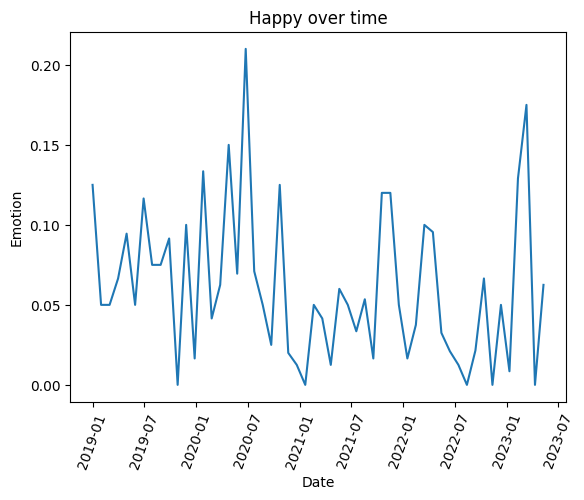

<Figure size 3000x1000 with 0 Axes>

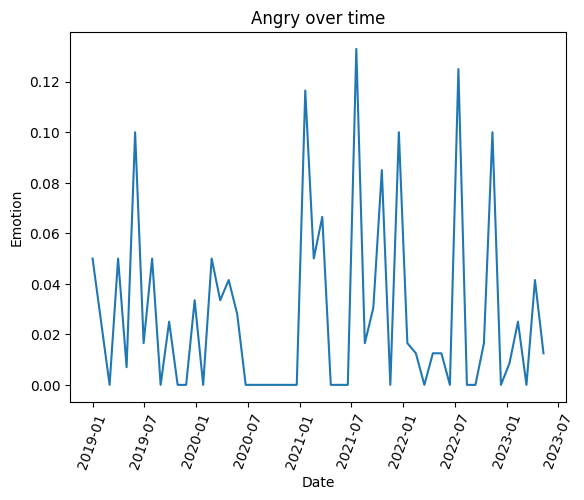

<Figure size 3000x1000 with 0 Axes>

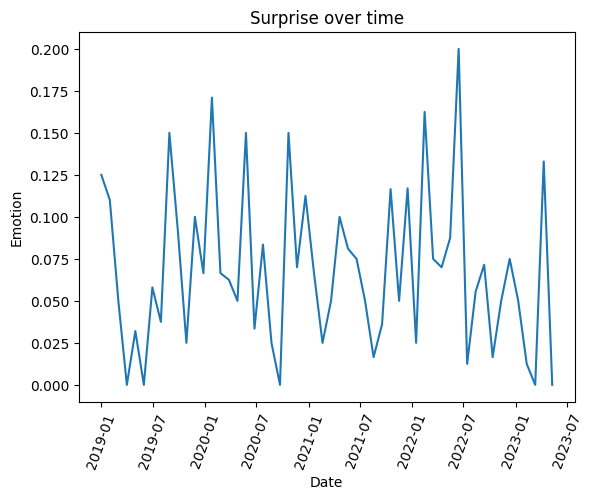

<Figure size 3000x1000 with 0 Axes>

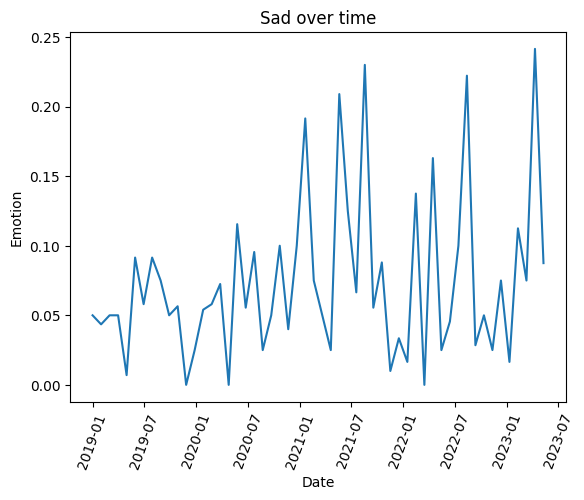

<Figure size 3000x1000 with 0 Axes>

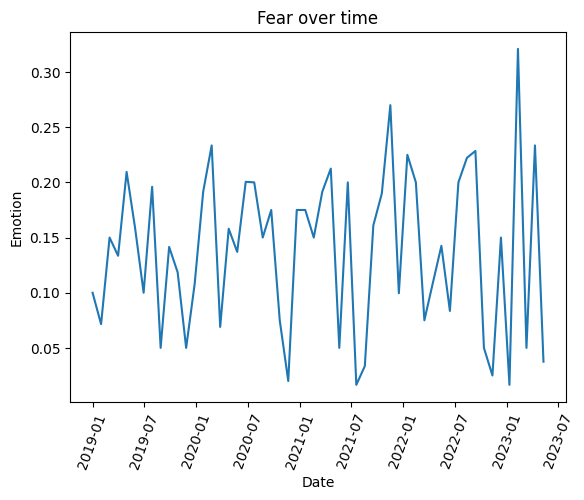

<Figure size 3000x1000 with 0 Axes>

In [249]:
emotions = [te.get_emotion(tweet) for tweet in tweets]

# group by date
emotions_by_date = {}
for i, date in enumerate(dates):
    if date not in emotions_by_date:
        emotions_by_date[date] = [emotions[i]]
    else:
        emotions_by_date[date].append(emotions[i])

# plot for each emotion
for emotion in emotions[0]:
    avg_emotions = {}

    for date in emotions_by_date:
        avg_emotions[date] = sum([em[emotion] for em in emotions_by_date[date]]) / len(emotions_by_date[date])

    x = []
    y = []
    curr_date = start_date
    while curr_date < end_date:
        x.append(curr_date)
        y.append(avg_emotions[curr_date.strftime('%Y-%m-%d')])
        curr_date += timedelta(days=30)

    plt.plot(x, y)
    plt.xlabel("Date")
    plt.ylabel("Emotion")
    plt.title(f"{emotion} over time")
    plt.tick_params(axis='x', rotation=70)
    plt.figure(figsize=(30,10))
    plt.tight_layout()
    plt.show()

Powyższe wykresy potwierdzają wyniki narzędzia Vader.

Wśród emocji nie ma jednej dominującej, wyniki są dosyć zbliżone.

### 4. Podsumowanie

W ramach tego projektu przeprowadziłam analizę sentymentu w mediach społecznościowych dotyczących tematu feminizmu.

Po przeprowadzeniu analizy sentymentu przy użyciu nltk.Vader oraz analizy emocji Text2Emotion okazało się, że większość tweetów była sklasyfikowana jako neutralne. Oznacza to, że większość tweetów nie wyrażała jednoznacznie pozytywnego ani negatywnego nastawienia wobec feminizmu. Wynik ten sugeruje, że opinie społeczeństwa na ten temat są zróżnicowane i trudno je jednoznacznie sklasyfikować.

Analiza sentymentu w różnych okresach czasu wykazała pewne wahania, ale ogólnie rzecz biorąc, sentyment w większości okresów był bliski neutralnemu. Oznacza to, że opinie społeczne na temat feminizmu nie wykazują znaczących skrajności ani jednostronności.

Wizualizacja danych na wykresie liniowym pokazała, jak postawy zmieniały się w czasie. Pomimo pewnych wahań, wartości sentymentu utrzymywały się wokół neutralnego poziomu. To ważne spostrzeżenie sugeruje, że temat feminizmu jest nadal przedmiotem dyskusji i niejednoznacznych opinii w społeczeństwie.

### 5. Bibliografia

- https://towardsdatascience.com/updated-text-preprocessing-techniques-for-sentiment-analysis-549af7fe412a
- https://towardsdatascience.com/sentiment-analysis-with-python-part-2-4f71e7bde59a
- https://dev.to/sunilaleti/don-t-blindly-remove-stopwords-in-sentiment-analysis-3nok
- https://medium.com/@yashj302/stopwords-nlp-python-4aa57dc492af